## SETUP: Load Packages

In [1]:
.libPaths()

[1] "/usr/local/lib/R/site-library" "/usr/lib/R/site-library"      
[3] "/usr/lib/R/library"

In [2]:

library(getSpatialData)
library(raster)
library(sp)
library(tidyverse)
library(sf)

Warning message in fun(libname, pkgname):
“rgeos: versions of GEOS runtime 3.9.1-CAPI-1.14.2
and GEOS at installation 3.9.0-CAPI-1.16.2differ”
── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ tibble  3.1.2     ✔ dplyr   1.0.6
✔ readr   1.4.0     ✔ stringr 1.4.0
✔ purrr   0.3.4     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::combine()      masks gridExtra::combine()
✖ terra::extract()      masks raster::extract(), tidyr::extract()
✖ dplyr::filter()       masks plotly::filter(), stats::filter()
✖ dplyr::lag()          masks stats::lag()
✖ latticeExtra::layer() masks ggplot2::layer()
✖ dplyr::select()       masks plotly::select(), raster::select()

Linking to GEOS 3.9.1, GDAL 3.2.1, PROJ 7.2.1


Linked against: 3.9.1-CAPI-1.14.2 compiled against: 3.9.0-CAPI-1.16.2

It is probably a good idea to reinstall sf, and maybe rgeos and rgdal too



In [1]:
x<-c( "tidyr", "rgdal", "ggplot2", "leaflet", "rasterVis", "gridExtra", 
     "RColorBrewer", "plotly")
lapply(x, require, character.only = TRUE)

Loading required package: tidyr

Loading required package: rgdal

Loading required package: sp

rgdal: version: 1.5-23, (SVN revision 1121)
Geospatial Data Abstraction Library extensions to R successfully loaded
Loaded GDAL runtime: GDAL 3.2.1, released 2020/12/29
Path to GDAL shared files: /usr/share/gdal
GDAL binary built with GEOS: TRUE 
Loaded PROJ runtime: Rel. 7.2.1, January 1st, 2021, [PJ_VERSION: 721]
Path to PROJ shared files: /home/turturo/.local/share/proj:/usr/share/proj
PROJ CDN enabled: FALSE
Linking to sp version:1.4-5
To mute warnings of possible GDAL/OSR exportToProj4() degradation,
use options("rgdal_show_exportToProj4_warnings"="none") before loading rgdal.

Loading required package: ggplot2

Loading required package: leaflet

Loading required package: rasterVis

Loading required package: raster


Attaching package: ‘raster’


The following object is masked from ‘package:tidyr’:

    extract


Loading required package: terra

terra version 1.2.10


Attaching package:

[[1]]
[1] TRUE

[[2]]
[1] TRUE

[[3]]
[1] TRUE

[[4]]
[1] TRUE

[[5]]
[1] TRUE

[[6]]
[1] TRUE

[[7]]
[1] TRUE

[[8]]
[1] TRUE

In [4]:
# Check Working Dir
getwd()

[1] "/mnt/pahestayin/ydisk21/coursera/EAGLE/Moscow"

## LOAD Study Area and AuxData

In [3]:
sam <- readOGR ("/mnt/pahestayin/ydisk21/coursera/EAGLE/Moscow/samolet")

# Transform  shapefile to the same CRS Coordinate Reference System
sam2 <- spTransform(sam, CRS ("+proj=longlat +datum=WGS84"))

m <- leaflet(sizingPolicy = leafletSizingPolicy(defaultHeight = 200, viewer.suppress = TRUE, knitr.figure = FALSE)) %>%
 addProviderTiles (providers$Esri.NatGeoWorldMap) %>% 
 addPolygons (data = sam2,
 stroke = FALSE,
 smoothFactor = 0.5
              )
m

OGR data source with driver: ESRI Shapefile 
Source: "/mnt/pahestayin/ydisk21/coursera/EAGLE/Moscow/samolet", layer: "samolet_28N"
with 1 features
It has 12 fields
Integer64 fields read as strings:  OID_ SymbolID 


Warning message in readOGR("/mnt/pahestayin/ydisk21/coursera/EAGLE/Moscow/samolet"):
“Z-dimension discarded”


HTML widgets cannot be represented in plain text (need html)

## LOAD Sentinel Data

In [4]:

# 2019.06.06
S190606 <- "/mnt/pahestayin/DATA_FOR_PROJECTS/EAGLE/S2A_MSIL2A_20190606T083601_N0212_R064_T37UDB_20190606T112641.SAFE"
S190606 <- list.files(S190606, recursive = TRUE, full.names = TRUE, pattern = "B0[2348]_10m.jp2$") 
S190606 <- lapply(1:length(S190606), function  (x )  {raster(S190606[x])}) 

# 2020.05.11
S200511 <- "/mnt/pahestayin/DATA_FOR_PROJECTS/EAGLE/S2A_MSIL2A_20200511T083611_N0214_R064_T37UDB_20200511T113205.SAFE"
S200511 <- list.files(S200511, recursive = TRUE, full.names = TRUE, pattern = "B0[2348]_10m.jp2$") 
S200511 <- lapply(1:length(S200511), function  (x )  {raster(S200511[x])}) 

# 2020.06.10
S200610 <- "/mnt/pahestayin/DATA_FOR_PROJECTS/EAGLE/S2A_MSIL2A_20200610T083611_N0214_R064_T37UDB_20200610T112436.SAFE"
# recursive - go to subfolders as well
S200610 <- list.files(S200610, recursive = TRUE, full.names = TRUE, pattern = "B0[2348]_10m.jp2$") 
S200610 <- lapply(1:length(S200610), function  (x )  {raster(S200610[x])}) # apply raster function to the elements in data folder

# 2021.05.11
S210511 <- "/mnt/pahestayin/DATA_FOR_PROJECTS/EAGLE/S2B_MSIL2A_20210511T083559_N0300_R064_T37UDB_20210512T152628.SAFE"
S210511 <- list.files(S210511, recursive = TRUE, full.names = TRUE, pattern = "B0[2348]_10m.jp2$") 
S210511 <- lapply(1:length(S210511), function  (x )  {raster(S210511[x])}) 

# 2021.06.03
S210603 <- "/mnt/pahestayin/DATA_FOR_PROJECTS/EAGLE/S2B_MSIL2A_20210603T084559_N0300_R107_T37UDB_20210603T110838.SAFE"
S210603 <- list.files(S210603, recursive = TRUE, full.names = TRUE, pattern = "B0[2348]_10m.jp2$") 
S210603 <- lapply(1:length(S210603), function  (x )  {raster(S210603[x])}) 

#2021.06.15
S210615 <-"//mnt/pahestayin/DATA_FOR_PROJECTS/EAGLE/S2B_MSIL2A_20210615T074609_N0300_R135_T38TNK_20210615T101025.SAFE"
S210615 <- list.files(S210615, recursive = TRUE, full.names = TRUE, pattern = "B0[2348]_10m.jp2$") 
S210615 <- lapply(1:length(S210615), function  (x )  {raster(S210615[x])}) 

#2021.06.20
S210620 <-"/mnt/pahestayin/DATA_FOR_PROJECTS/EAGLE/S2B_MSIL2A_20210620T083559_N0300_R064_T37UDB_20210620T113235.SAFE"
S210620 <- list.files(S210620, recursive = TRUE, full.names = TRUE, pattern = "B0[2348]_10m.jp2$") 
S210620 <- lapply(1:length(S210620), function  (x )  {raster(S210620[x])}) 

# Visualize Sentinel Data and study_ara
- spTransform Study Area: to avoid "Error extent doesn't overlap" when plottig or croping study area coordinate systems of Sentinnel Data and Study Area must match. spTransform handles that


### 2019.06.06

OGR data source with driver: ESRI Shapefile 
Source: "/mnt/pahestayin/ydisk21/coursera/EAGLE/Moscow/samolet", layer: "samolet_28N"
with 1 features
It has 12 fields
Integer64 fields read as strings:  OID_ SymbolID 


Warning message in readOGR("/mnt/pahestayin/ydisk21/coursera/EAGLE/Moscow/samolet"):
“Z-dimension discarded”


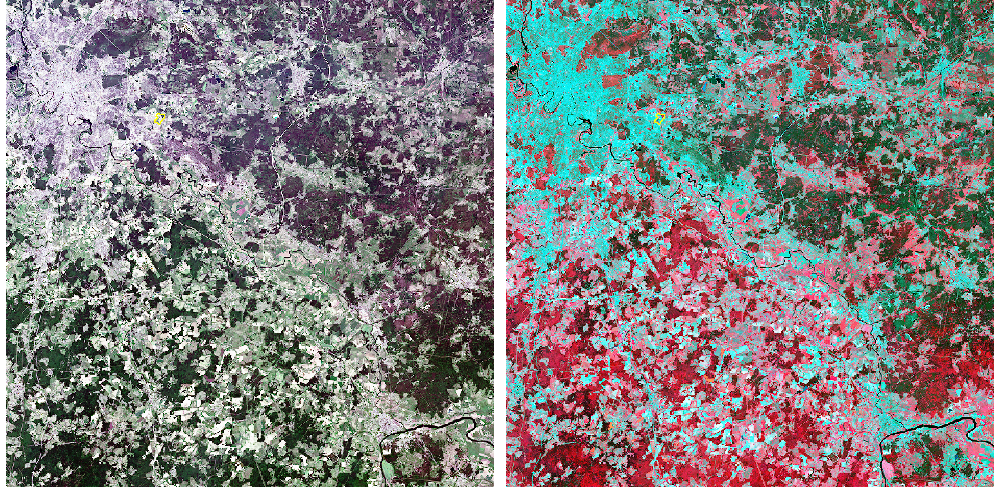

In [5]:
# Set Layout
options(repr.plot.width=41, repr.plot.height=20)
m <- rbind(c(1, 2))
layout (m)

# Stack   Convert our list of raster layers from S2 into raster stack 
S190606_stack <- stack(S190606)

# sptransform
study_area <- readOGR ("/mnt/pahestayin/ydisk21/coursera/EAGLE/Moscow/samolet")
study_area <- spTransform(study_area, CRS(proj4string(S190606_stack)))

# Plot True/False images
plotRGB(S190606_stack,  r=3,  g=2,  b=1,  scale=maxValue(S190606[[2]]), stretch='hist') # rgb indices come from B0[2348]
plot(study_area, add=TRUE,  border='yellow',  lwd=5) # My Study Area is Larger than this data so no yellow border
plotRGB(S190606_stack,  r=4,  g=3,  b=2,  scale=maxValue (S190606[[2]]),  stretch='hist')
plot(study_area, add=TRUE,  border='yellow',  lwd=5)

# PROCESS SENTINEL DATA

### CROP 
- spTransform was applied above
- Error extent doesn't overlap issues brilliantly solved https://stackoverflow.com/questions/47885065/crop-raster-with-polygon-in-r-error-extent-does-not-overlap
- No overlap error comes because you were giving it a projection that wasn't its real one. There is a big difference between stating the projection and transforming the projection. When you play with projection, let the function read the projection from the file, than always transform using the appropriate function (spTransform, projectRaster or gdalwarp)

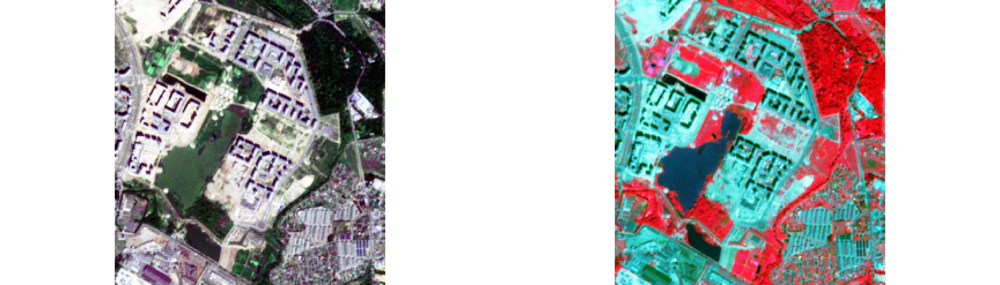

In [6]:
# Set layout
options(repr.plot.width=35, repr.plot.height=10)
m <- rbind(c(1, 2))
layout (m)

# Crop and plot
S190606_stack_crop <- crop (S190606_stack, study_area)
plotRGB (S190606_stack_crop, r=3, g=2, b=1, scale=maxValue (S190606[[2]]), stretch="hist") # | strech="lin"
plotRGB(S190606_stack_crop, r=4, g=3, b=2, scale=maxValue (S190606[[2]]), stretch="hist") # į strech="lin"

In [7]:
# stack 
S200511_stack <- stack(S200511)
S200610_stack <- stack(S200610)
S210511_stack <- stack(S210511)
S210603_stack <- stack(S210603)
#S210615_stack <- stack(S210615)
S210620_stack <- stack(S210620)

# Crop the rest
S200511_stack_crop <- crop (S200511_stack, study_area)
S200610_stack_crop <- crop (S200610_stack, study_area)
S210511_stack_crop <- crop (S210511_stack, study_area)
S210603_stack_crop <- crop (S210603_stack, study_area)
#S210615_stack_crop <- crop (S210615_stack, study_area)
S210620_stack_crop <- crop (S210620_stack, study_area)

### Import Referrence points shapefile, spTransform

In [8]:
# Reference Points Shapefile Sync
points <- readOGR("/mnt/pahestayin/ydisk21/coursera/EAGLE/Moscow/samolet_points")
points <- spTransform(points, CRS(proj4string(S190606_stack)))

OGR data source with driver: ESRI Shapefile 
Source: "/mnt/pahestayin/ydisk21/coursera/EAGLE/Moscow/samolet_points", layer: "samolet_points_28N"
with 5 features
It has 1 fields


## DERIVE  Normalized Difference Vegetation Index (NDVI)

- https://www.earthdatascience.org/courses/earth-analytics/multispectral-remote-sensing-data/vegetation-indices-NDVI-in-R/
- NDVI FORMULA    NEAR INFRARED - RED / NEAR INFRARED + RED
- FOR NDVI We need only BANDS 4 and 8
- S2_stack[[4]]   === T38TNK_20210516T074609_B08_10m --BAND B08 is NEAR INFRARED In Sentinel 2
- S2_stack[[3]]   === T38TNK_20210516T074609_B04_10m -- BAND 04 in RED  
- THE FOR LOOP AND FUNCTION BELOW is to take only band 4 and 8 from Data
- NDVI List frist element needs to take 3rd element from S2_stack list , BAND # 3

### NDVI 

In [9]:
ndvi <- function(x, y) {
    (y-x) / (y+x)
}

In [10]:
NDVI_S190606 <- overlay(S190606_stack_crop[[3]], S190606_stack_crop[[4]], fun=ndvi)

NDVI_S200511 <- overlay(S200511_stack_crop[[3]], S200511_stack_crop[[4]], fun=ndvi)
NDVI_S200610 <- overlay(S200610_stack_crop[[3]], S200610_stack_crop[[4]], fun=ndvi)
NDVI_S210511 <- overlay(S210511_stack_crop[[3]], S210511_stack_crop[[4]], fun=ndvi)
NDVI_S210603 <- overlay(S210603_stack_crop[[3]], S210603_stack_crop[[4]], fun=ndvi)
#NDVI_S210615 <- overlay(S210615_stack_crop[[3]], S210615_stack_crop[[4]], fun=ndvi)
NDVI_S210620 <- overlay(S210620_stack_crop[[3]],S210620_stack_crop[[4]], fun=ndvi)

In [11]:
NDVI_S190606

class      : RasterLayer 
dimensions : 247, 234, 57798  (nrow, ncol, ncell)
resolution : 10, 10  (x, y)
extent     : 433320, 435660, 6172000, 6174470  (xmin, xmax, ymin, ymax)
crs        : +proj=utm +zone=37 +datum=WGS84 +units=m +no_defs 
source     : memory
names      : layer 
values     : -0.1169355, 0.906141  (min, max)


## Plot NDVI

In [12]:
# Set Layout
options (repr.plot.width=100, repr.plot.height=90)

# Create custom color
breaks <- c(-1, -0.8, -0.5, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1)
pal <- brewer.pal(11,"RdYlGn")
mapTheme <- rasterTheme (region = pal)
mapTheme$fontsize$text = 60

# Plot NDVI && points of reference
levelplot(stack(NDVI_S190606), scales=list(draw=FALSE), colorkey=TRUE, par.settings=mapTheme) + 
layer(sp.points(points, pch=13, col='navyblue', bg='red', cex= 16, lwd=10)) 

In [87]:
# Set Layout
options (repr.plot.width=200, repr.plot.height=90)

#main="NDVI 2019.06.06"
#cex.main=20

# Create custom color
breaks <- c(-1, -0.8, -0.5, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1)
pal <- brewer.pal(11,"RdYlGn")
mapTheme <- rasterTheme (region = pal)
mapTheme$fontsize$text = 60

# side by side 
p1 <- levelplot(stack(NDVI_S190606), main="NDVI 2019.06.06", cex.main=3, scales=list(draw=FALSE),
    colorkey=TRUE, par.settings=mapTheme) + 
layer(sp.points(points, pch=13, col='navyblue', bg='red', cex= 16, lwd=10))  
p2 <- levelplot(stack(NDVI_S200610), scales=list(draw=FALSE), colorkey=TRUE, par.settings=mapTheme) + 
layer(sp.points(points, pch=13, col='navyblue', bg='red', cex= 16, lwd=10))
p3 <- levelplot(stack(NDVI_S210603), scales=list(draw=FALSE), colorkey=FALSE, par.settings=mapTheme) + 
layer(sp.points(points, pch=13, col='navyblue', bg='red', cex= 16, lwd=10))

grid.arrange(p1, p2, p3, ncol = 3)

### NDVI Histogram

In [13]:
# view histogram of data
hist(NDVI_S190606,
     main = "Distribution of NDVI values",
     xlab = "NDVI",
     ylab= "Frequency",
     col = "lightseagreen",
     xlim = c(-0.5, 1),
     breaks = 30,
     xaxt = 'n')
axis(side=1, at = seq(-0.5,1, 0.05), labels = seq(-0.5,1, 0.05))

In [15]:
?raster::extract

Warning message in seq_len(head.end.idx):
“first element used of 'length.out' argument”
ERROR while rich displaying an object: Error in seq_len(head.end.idx): argument must be coercible to non-negative integer

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_conte

# Extract

In [14]:
points

Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



          coordinates Id
1 (435117.4, 6173928)  0
2 (434550.5, 6173701)  0
3 (435038.6, 6173104)  0
4   (434671, 6173368)  0
5 (434194.9, 6172545)  0

In [15]:
#sp1 <- SpatialPoints(points)
#sp1
points@coords

coords.x1,coords.x2
435117.4,6173928
434550.5,6173701
435038.6,6173104
434671.0,6173368
434194.9,6172545


In [16]:
#NDVI_S190606_points <-lapply(NDVI_S190606, 
 #FUN=function (NDVI_S190606) {extract(NDVI_S190606, sp1, method='bilinear', df=TRUE)})

NDVI_S190606_points <- extract(NDVI_S190606, points, method='bilinear', df= TRUE)
NDVI_S200511_points <-extract(NDVI_S200511, points, method='bilinear', df= TRUE) 
NDVI_S200610_points <-extract(NDVI_S200610, points, method='bilinear', df= TRUE) 
NDVI_S210511_points <-extract(NDVI_S210511, points, method='bilinear', df= TRUE) 
NDVI_S210603_points <-extract(NDVI_S210603, points, method='bilinear', df= TRUE) 
NDVI_S210620_points <-extract(NDVI_S210620, points, method='bilinear', df= TRUE)

NDVI_S190606_points

ID,layer
<dbl>,<dbl>
1,0.8700409
2,0.8496822
3,0.7041454
4,0.6750358
5,0.8469766


In [17]:
NDVI_S200511_points[1]

ID
<dbl>
1
2
3
4
5


In [18]:
NDVI_points_all <- do.call("cbind", list(NDVI_S190606_points,NDVI_S200511_points,NDVI_S200610_points,
    NDVI_S210511_points,NDVI_S210603_points,NDVI_S210620_points))
NDVI_points_all

ID,layer,ID,layer,ID,layer,ID,layer,ID,layer,ID,layer
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.8700409,1,0.8167743,1,0.8526619,1,0.6833592,1,0.9002848,1,0.8880729
2,0.8496822,2,0.4699830,2,0.8547818,2,0.4751664,2,0.8859518,2,0.8765771
3,0.7041454,3,0.5493021,3,0.8127471,3,0.3711274,3,0.7811349,3,0.8180828
4,0.6750358,4,0.6495719,4,0.8200741,4,0.4722539,4,0.8153803,4,0.8099817
5,0.8469766,5,0.7440577,5,0.8609098,5,0.5524214,5,0.8865524,5,0.8987978


In [19]:
colnames(NDVI_points_all) <- c("ID", "NDVI_S190606","ID","NDVI_S200511","ID","NDVI_S200610",
        "ID", "NDVI_S210511","ID","NDVI_S210603","ID","NDVI_S210620")
NDVI_points_all

ID,NDVI_S190606,ID,NDVI_S200511,ID,NDVI_S200610,ID,NDVI_S210511,ID,NDVI_S210603,ID,NDVI_S210620
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.8700409,1,0.8167743,1,0.8526619,1,0.6833592,1,0.9002848,1,0.8880729
2,0.8496822,2,0.4699830,2,0.8547818,2,0.4751664,2,0.8859518,2,0.8765771
3,0.7041454,3,0.5493021,3,0.8127471,3,0.3711274,3,0.7811349,3,0.8180828
4,0.6750358,4,0.6495719,4,0.8200741,4,0.4722539,4,0.8153803,4,0.8099817
5,0.8469766,5,0.7440577,5,0.8609098,5,0.5524214,5,0.8865524,5,0.8987978


In [20]:
NDVI_points_all <- NDVI_points_all[, !duplicated(colnames(NDVI_points_all))]
NDVI_points_all

ID,NDVI_S190606,NDVI_S200511,NDVI_S200610,NDVI_S210511,NDVI_S210603,NDVI_S210620
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.8700409,0.8167743,0.8526619,0.6833592,0.9002848,0.8880729
2,0.8496822,0.4699830,0.8547818,0.4751664,0.8859518,0.8765771
3,0.7041454,0.5493021,0.8127471,0.3711274,0.7811349,0.8180828
4,0.6750358,0.6495719,0.8200741,0.4722539,0.8153803,0.8099817
5,0.8469766,0.7440577,0.8609098,0.5524214,0.8865524,0.8987978


## SUBSET NDVI Points of our interest

In [21]:
keep <- c("ID","NDVI_S190606", "NDVI_S200610","NDVI_S210603")
NDVI_points_sub <-NDVI_points_all[keep]
NDVI_points_sub

ID,NDVI_S190606,NDVI_S200610,NDVI_S210603
<dbl>,<dbl>,<dbl>,<dbl>
1,0.8700409,0.8526619,0.9002848
2,0.8496822,0.8547818,0.8859518
3,0.7041454,0.8127471,0.7811349
4,0.6750358,0.8200741,0.8153803
5,0.8469766,0.8609098,0.8865524


In [22]:
# Optimize for ggplot data structure
NDVI_points_sub<- gather(NDVI_points_sub, key = Date, value= value, -ID)
NDVI_points_sub

ID,Date,value
<dbl>,<chr>,<dbl>
1,NDVI_S190606,0.8700409
2,NDVI_S190606,0.8496822
3,NDVI_S190606,0.7041454
4,NDVI_S190606,0.6750358
5,NDVI_S190606,0.8469766
1,NDVI_S200610,0.8526619
2,NDVI_S200610,0.8547818
3,NDVI_S200610,0.8127471
4,NDVI_S200610,0.8200741


## Plot NDVI Temporal Series

In [23]:
library("ggplot2")
library(plotly)

In [24]:
library(plotly)

p <- qplot(Date, value, data=NDVI_points_sub, group=ID, colour=ID) +geom_line() + geom_point()
as_widget(ggplotly(p))

HTML widgets cannot be represented in plain text (need html)